# Machine Learning Engineer Nanodegree
## Supervised Learning
## Project: Finding Donors for *CharityML*

Welcome to the second project of the Machine Learning Engineer Nanodegree! In this notebook, some template code has already been provided for you, and it will be your job to implement the additional functionality necessary to successfully complete this project. Sections that begin with **'Implementation'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section and the specifics of the implementation are marked in the code block with a `'TODO'` statement. Please be sure to read the instructions carefully!

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.  

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

## Getting Started

In this project, you will employ several supervised algorithms of your choice to accurately model individuals' income using data collected from the 1994 U.S. Census. You will then choose the best candidate algorithm from preliminary results and further optimize this algorithm to best model the data. Your goal with this implementation is to construct a model that accurately predicts whether an individual makes more than $50,000. This sort of task can arise in a non-profit setting, where organizations survive on donations.  Understanding an individual's income can help a non-profit better understand how large of a donation to request, or whether or not they should reach out to begin with.  While it can be difficult to determine an individual's general income bracket directly from public sources, we can (as we will see) infer this value from other publically available features. 

The dataset for this project originates from the [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/datasets/Census+Income). The datset was donated by Ron Kohavi and Barry Becker, after being published in the article _"Scaling Up the Accuracy of Naive-Bayes Classifiers: A Decision-Tree Hybrid"_. You can find the article by Ron Kohavi [online](https://www.aaai.org/Papers/KDD/1996/KDD96-033.pdf). The data we investigate here consists of small changes to the original dataset, such as removing the `'fnlwgt'` feature and records with missing or ill-formatted entries.

----
## Exploring the Data
Run the code cell below to load necessary Python libraries and load the census data. Note that the last column from this dataset, `'income'`, will be our target label (whether an individual makes more than, or at most, $50,000 annually). All other columns are features about each individual in the census database.

In [2]:
# Import libraries necessary for this project
import numpy as np
import pandas as pd
from time import time
from IPython.display import display # Allows the use of display() for DataFrames

# Import supplementary visualization code visuals.py
import visuals as vs

# Pretty display for notebooks
%matplotlib inline

# Load the Census dataset
data = pd.read_csv("census.csv")

# Success - Display the first record
display(data.head(n=1))

,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K


## Scatter Plots

These plots compare two features at a time. It gives a quick overview of which features are an indicator of how much a person earns.

The contry of origin plots are omitted. They where analyse in a previous phase but just clog up the visualization.

workclass workclass
education-num workclass
education-num education-num
marital-status workclass
marital-status education-num
marital-status marital-status
occupation workclass
occupation education-num
occupation marital-status
occupation occupation
relationship workclass
relationship education-num
relationship marital-status
relationship occupation
relationship relationship
race workclass
race education-num
race marital-status
race occupation
race relationship
race race


/usr/lib/python2.7/dist-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


sex workclass
sex education-num
sex marital-status
sex occupation
sex relationship
sex race
sex sex
age workclass
age education-num
age marital-status
age occupation
age relationship
age race
age sex
age age
capital-gain workclass
capital-gain education-num
capital-gain marital-status
capital-gain occupation
capital-gain relationship
capital-gain race
capital-gain sex
capital-gain age
capital-gain capital-gain
capital-loss workclass
capital-loss education-num
capital-loss marital-status
capital-loss occupation
capital-loss relationship
capital-loss race
capital-loss sex
capital-loss age
capital-loss capital-gain
capital-loss capital-loss
hours-per-week workclass
hours-per-week education-num
hours-per-week marital-status
hours-per-week occupation
hours-per-week relationship
hours-per-week race
hours-per-week sex
hours-per-week age
hours-per-week capital-gain
hours-per-week capital-loss
hours-per-week hours-per-week
education_level workclass
education_level education-num
education_level 

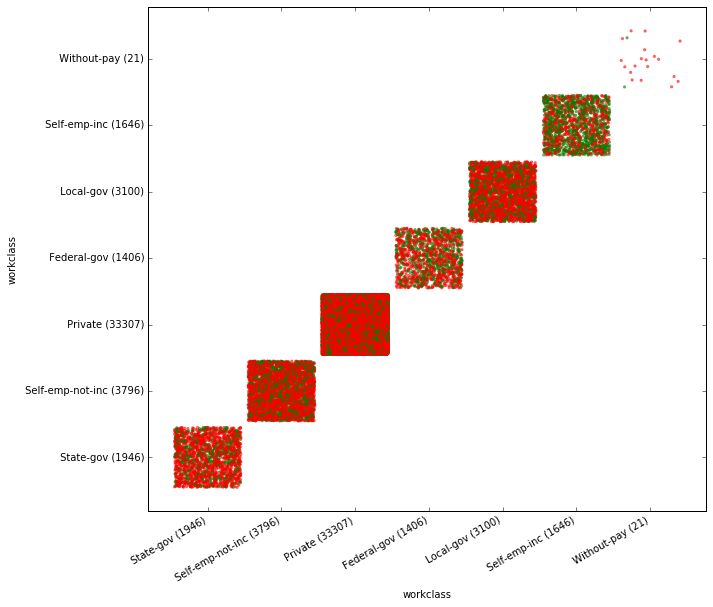

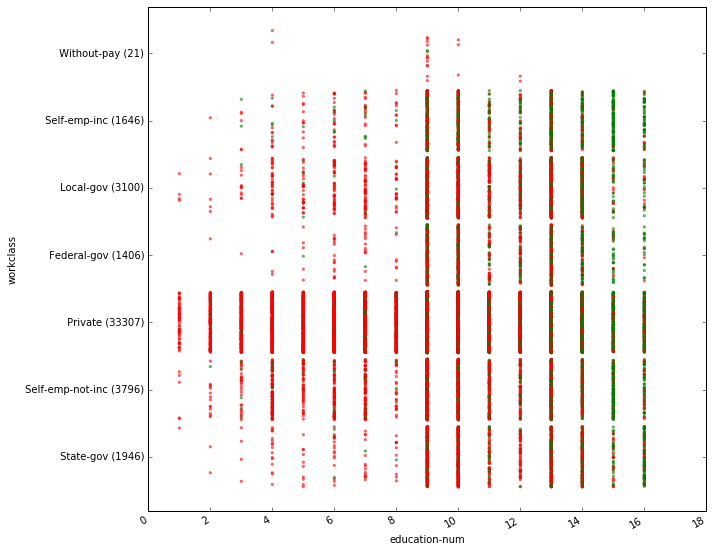

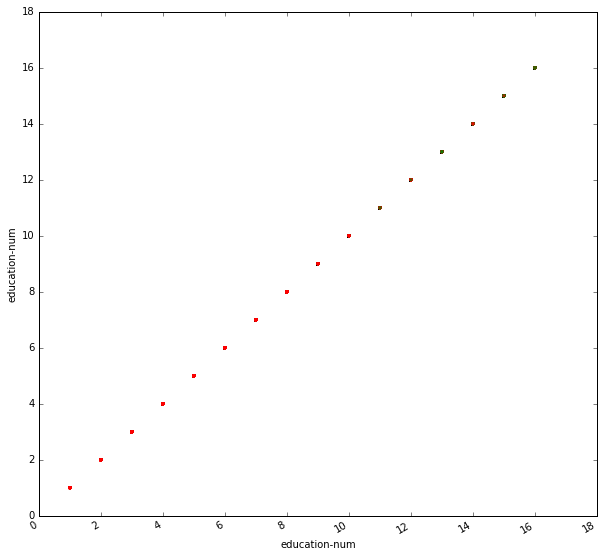

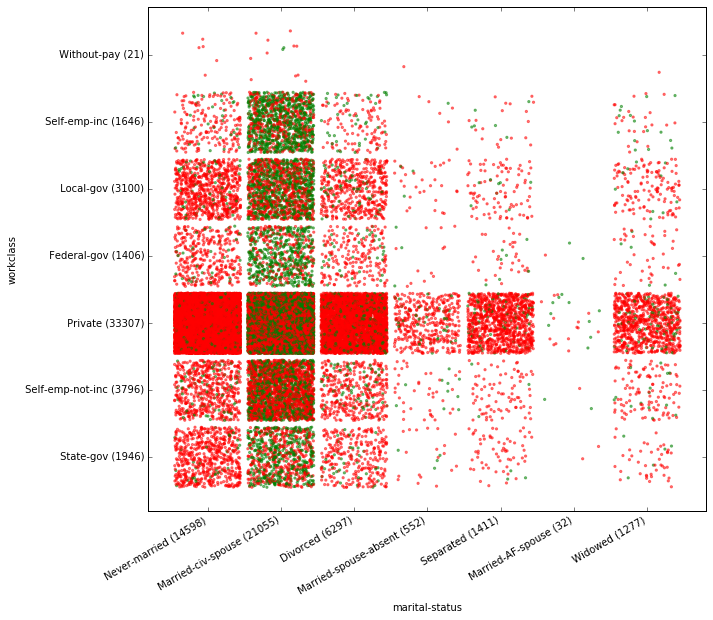

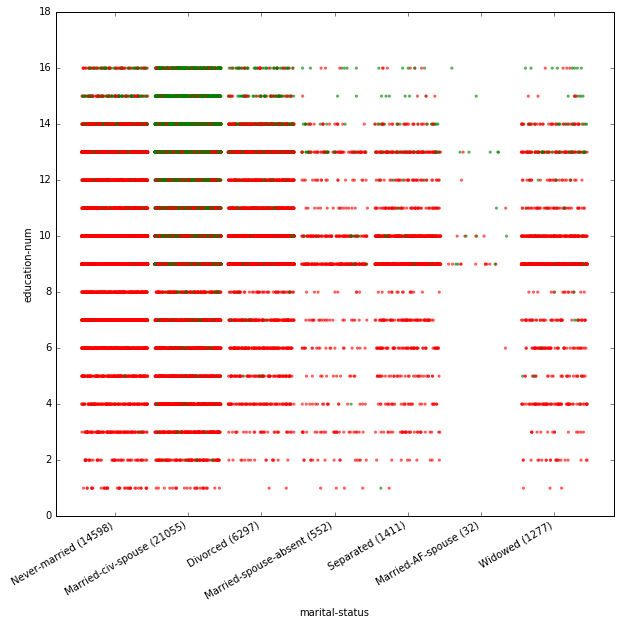

...

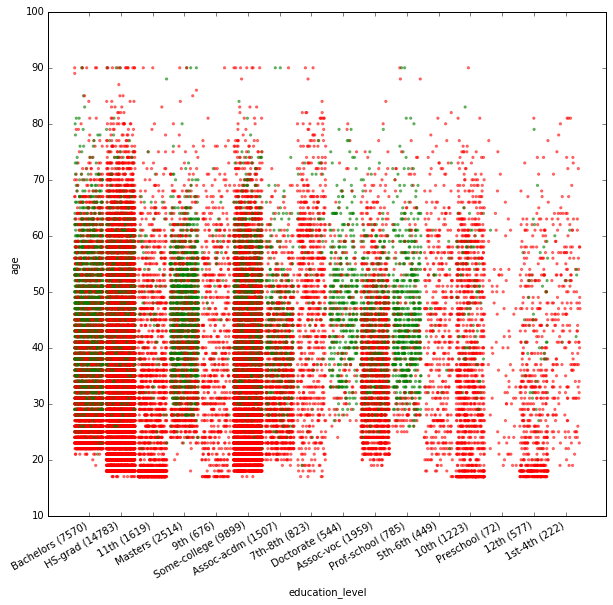

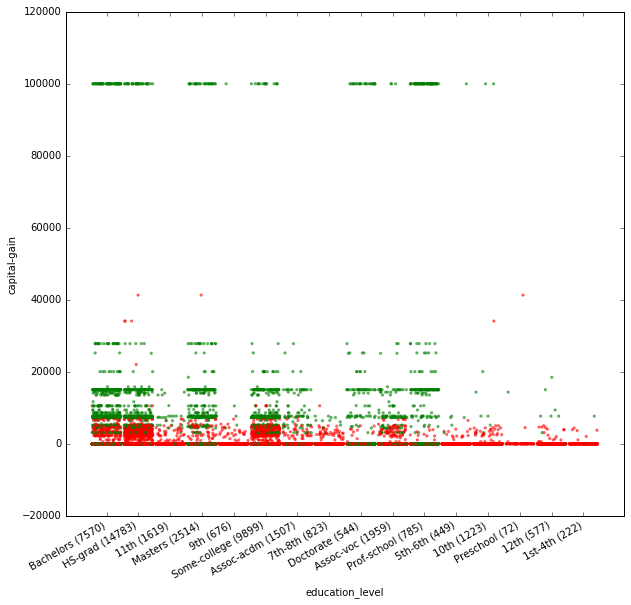

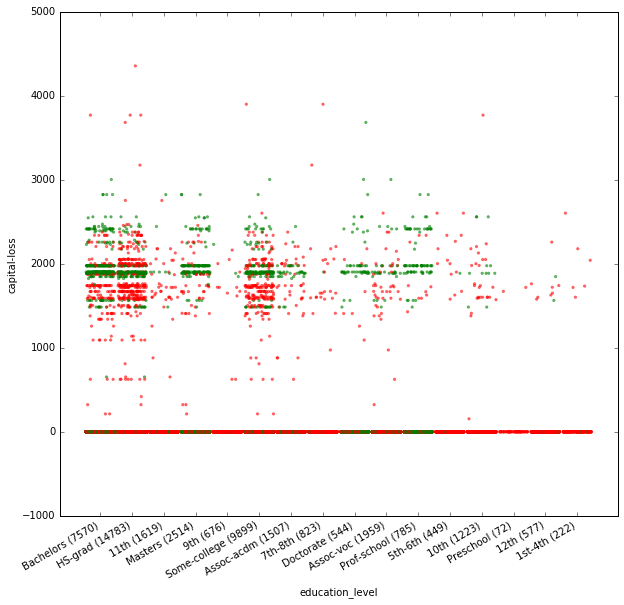

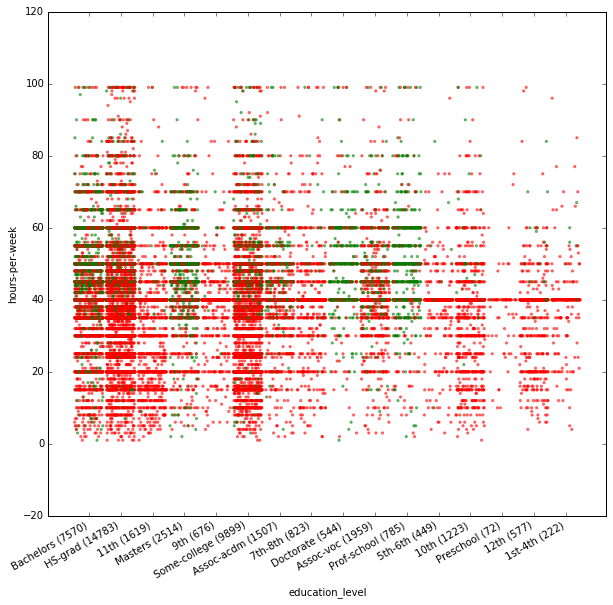

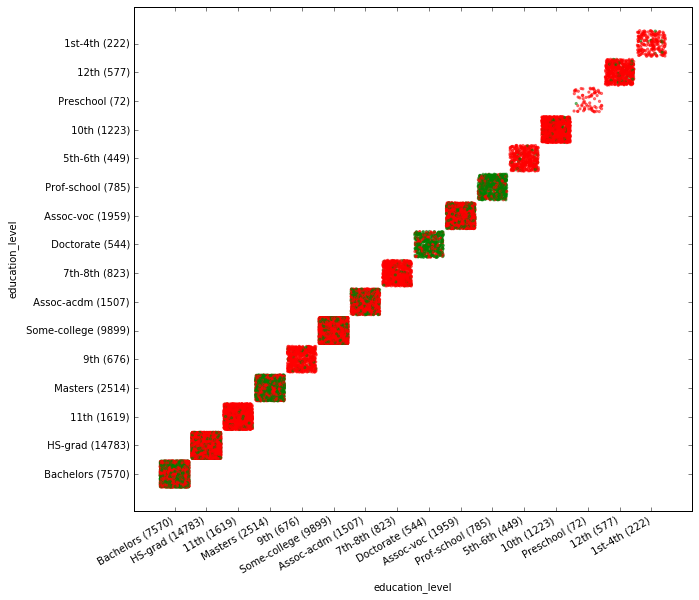

In [18]:
import matplotlib.pyplot as plt
import random

def isCategorical(featureName):
    return featureName in ["workclass", "education_level", "marital-status", "occupation", "relationship", "race", "sex", "native-country"]

exploredCategories=["workclass", "education-num", "marital-status", "occupation", "relationship", "race", "sex", "age", "capital-gain", "capital-loss", "hours-per-week", "education_level"]


def jitter(square_size):
    return -0.5*square_size + random.uniform(0, square_size)

def categoryAsList(category):
    l = list(data[category].unique())
    # Append the number of people for each possibility of the category
    for i, value in enumerate(l):
        l[i]= value + " (" + str(data[category].value_counts()[value]) + ")"

    return l

def myIndex(myList, myValue):
    for i,v in enumerate(myList):
        if myValue in v:
            return i
    return 0

for i in range(len(exploredCategories)):
    for j in range(i+1):
        
        categoryX = exploredCategories[i]
        categoryY = exploredCategories[j]
        print categoryX, categoryY
        
        square_size = 0.9
        plt.figure(figsize=(10,10))

        plt.xlabel(categoryX)
        plt.ylabel(categoryY)
        
        x = []
        y = []
        
        if(isCategorical(categoryX)):
            xList = categoryAsList(categoryX)
            plt.xticks(range(len(xList)), xList)
            x = [myIndex(xList, s) + jitter(square_size) for s in data[categoryX]]
        else:
            x = [x for x in data[exploredCategories[i]]]
        
        if(isCategorical(categoryY)):
            yList = categoryAsList(categoryY)
            plt.yticks(range(len(yList)), yList)
            y = [myIndex(yList, s) + jitter(square_size) for s in data[categoryY]]
        else:
            y = [y for y in data[exploredCategories[j]]]

        # Prepare the plot: Every person gets plotted randomly into a square determined by the two categories
        c = ["g" if income != "<=50K" else "r" for income in data['income']]
        
        # Shuffle the three lists so that red doesn't draw over green or the other way around
        random.seed(1)
        random.shuffle(x)
        random.seed(1)
        random.shuffle(y)
        random.seed(1)
        random.shuffle(c)
        
        # Make the x ticks pretty
        plt.gcf().autofmt_xdate()
        
        plt.scatter(x,y, marker=".", color=c, alpha=0.5)

### Implementation: Data Exploration
A cursory investigation of the dataset will determine how many individuals fit into either group, and will tell us about the percentage of these individuals making more than \$50,000. In the code cell below, you will need to compute the following:
- The total number of records, `'n_records'`
- The number of individuals making more than \$50,000 annually, `'n_greater_50k'`.
- The number of individuals making at most \$50,000 annually, `'n_at_most_50k'`.
- The percentage of individuals making more than \$50,000 annually, `'greater_percent'`.

**Hint:** You may need to look at the table above to understand how the `'income'` entries are formatted. 

In [3]:
n_records = len(data)
n_greater_50k = len(data[data['income'] == ">50K"])
n_at_most_50k = len(data[data['income'] == "<=50K"])
greater_percent = n_greater_50k / float(n_records)

# Print the results
print "Total number of records: {}".format(n_records)
print "Individuals making more than $50,000: {}".format(n_greater_50k)
print "Individuals making at most $50,000: {}".format(n_at_most_50k)
print "Percentage of individuals making more than $50,000: {:.2f}%".format(greater_percent)

Total number of records: 45222
Individuals making more than $50,000: 11208
Individuals making at most $50,000: 34014
Percentage of individuals making more than $50,000: 0.25%


----
## Preparing the Data
Before data can be used as input for machine learning algorithms, it often must be cleaned, formatted, and restructured — this is typically known as **preprocessing**. Fortunately, for this dataset, there are no invalid or missing entries we must deal with, however, there are some qualities about certain features that must be adjusted. This preprocessing can help tremendously with the outcome and predictive power of nearly all learning algorithms.

### Transforming Skewed Continuous Features
A dataset may sometimes contain at least one feature whose values tend to lie near a single number, but will also have a non-trivial number of vastly larger or smaller values than that single number.  Algorithms can be sensitive to such distributions of values and can underperform if the range is not properly normalized. With the census dataset two features fit this description: '`capital-gain'` and `'capital-loss'`. 

Run the code cell below to plot a histogram of these two features. Note the range of the values present and how they are distributed.

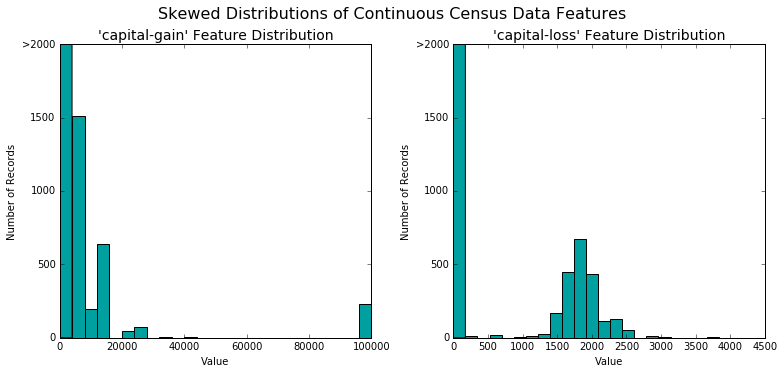

In [4]:
# Split the data into features and target label
income_raw = data['income']
features_raw = data.drop('income', axis = 1)

# Visualize skewed continuous features of original data
vs.distribution(data)

For highly-skewed feature distributions such as `'capital-gain'` and `'capital-loss'`, it is common practice to apply a <a href="https://en.wikipedia.org/wiki/Data_transformation_(statistics)">logarithmic transformation</a> on the data so that the very large and very small values do not negatively affect the performance of a learning algorithm. Using a logarithmic transformation significantly reduces the range of values caused by outliers. Care must be taken when applying this transformation however: The logarithm of `0` is undefined, so we must translate the values by a small amount above `0` to apply the the logarithm successfully.

Run the code cell below to perform a transformation on the data and visualize the results. Again, note the range of values and how they are distributed. 

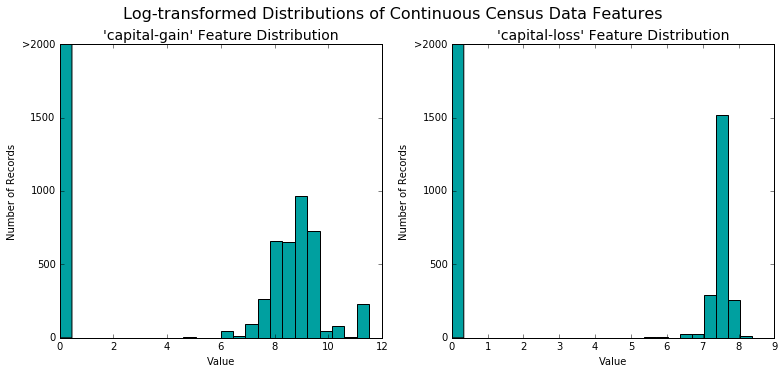

In [5]:
# Log-transform the skewed features
skewed = ['capital-gain', 'capital-loss']
features_raw[skewed] = data[skewed].apply(lambda x: np.log(x + 1))

# Visualize the new log distributions
vs.distribution(features_raw, transformed = True)

### Normalizing Numerical Features
In addition to performing transformations on features that are highly skewed, it is often good practice to perform some type of scaling on numerical features. Applying a scaling to the data does not change the shape of each feature's distribution (such as `'capital-gain'` or `'capital-loss'` above); however, normalization ensures that each feature is treated equally when applying supervised learners. Note that once scaling is applied, observing the data in its raw form will no longer have the same original meaning, as exampled below.

Run the code cell below to normalize each numerical feature. We will use [`sklearn.preprocessing.MinMaxScaler`](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html) for this.

In [6]:
# Import sklearn.preprocessing.StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Initialize a scaler, then apply it to the features
scaler = MinMaxScaler()
numerical = ['age', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week']

features_raw[numerical] = scaler.fit_transform(data[numerical])

# Show an example of a record with scaling applied
display(features_raw.head(n = 1))

,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,0.30137,State-gov,Bachelors,0.8,Never-married,Adm-clerical,Not-in-family,White,Male,0.02174,0.0,0.397959,United-States


### Implementation: Data Preprocessing

From the table in **Exploring the Data** above, we can see there are several features for each record that are non-numeric. Typically, learning algorithms expect input to be numeric, which requires that non-numeric features (called *categorical variables*) be converted. One popular way to convert categorical variables is by using the **one-hot encoding** scheme. One-hot encoding creates a _"dummy"_ variable for each possible category of each non-numeric feature. For example, assume `someFeature` has three possible entries: `A`, `B`, or `C`. We then encode this feature into `someFeature_A`, `someFeature_B` and `someFeature_C`.

|   | someFeature |                    | someFeature_A | someFeature_B | someFeature_C |
| :-: | :-: |                            | :-: | :-: | :-: |
| 0 |  B  |  | 0 | 1 | 0 |
| 1 |  C  | ----> one-hot encode ----> | 0 | 0 | 1 |
| 2 |  A  |  | 1 | 0 | 0 |

Additionally, as with the non-numeric features, we need to convert the non-numeric target label, `'income'` to numerical values for the learning algorithm to work. Since there are only two possible categories for this label ("<=50K" and ">50K"), we can avoid using one-hot encoding and simply encode these two categories as `0` and `1`, respectively. In code cell below, you will need to implement the following:
 - Use [`pandas.get_dummies()`](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.get_dummies.html?highlight=get_dummies#pandas.get_dummies) to perform one-hot encoding on the `'features_raw'` data.
 - Convert the target label `'income_raw'` to numerical entries.
   - Set records with "<=50K" to `0` and records with ">50K" to `1`.

In [7]:
# TODO: One-hot encode the 'features_raw' data using pandas.get_dummies()
features = pd.get_dummies(features_raw)

income = income_raw.astype("str")
income.replace(["<=50K",">50K"], [0,1], inplace=True)

# Print the number of features after one-hot encoding
encoded = list(features.columns)
print "{} total features after one-hot encoding.".format(len(encoded))

# Uncomment the following line to see the encoded feature names
display(features.head(n = 1))

103 total features after one-hot encoding.


,age,education-num,capital-gain,capital-loss,hours-per-week,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,...,native-country_ Portugal,native-country_ Puerto-Rico,native-country_ Scotland,native-country_ South,native-country_ Taiwan,native-country_ Thailand,native-country_ Trinadad&Tobago,native-country_ United-States,native-country_ Vietnam,native-country_ Yugoslavia
0,0.30137,0.8,0.02174,0.0,0.397959,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


### Shuffle and Split Data
Now all _categorical variables_ have been converted into numerical features, and all numerical features have been normalized. As always, we will now split the data (both features and their labels) into training and test sets. 80% of the data will be used for training and 20% for testing.

Run the code cell below to perform this split.

In [8]:
# Import train_test_split
from sklearn.cross_validation import train_test_split

# Split the 'features' and 'income' data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, income, test_size = 0.2, random_state = 0)

X_train.to_csv("census_train_features.csv")
y_train.to_csv("census_train_labels.csv")

# Show the results of the split
print "Training set has {} samples.".format(X_train.shape[0])
print "Testing set has {} samples.".format(X_test.shape[0])

Training set has 36177 samples.
Testing set has 9045 samples.


----
## Evaluating Model Performance
In this section, we will investigate four different algorithms, and determine which is best at modeling the data. Three of these algorithms will be supervised learners of your choice, and the fourth algorithm is known as a *naive predictor*.

### Metrics and the Naive Predictor
*CharityML*, equipped with their research, knows individuals that make more than \$50,000 are most likely to donate to their charity. Because of this, *CharityML* is particularly interested in predicting who makes more than \$50,000 accurately. It would seem that using **accuracy** as a metric for evaluating a particular model's performace would be appropriate. Additionally, identifying someone that *does not* make more than \$50,000 as someone who does would be detrimental to *CharityML*, since they are looking to find individuals willing to donate. Therefore, a model's ability to precisely predict those that make more than \$50,000 is *more important* than the model's ability to **recall** those individuals. We can use **F-beta score** as a metric that considers both precision and recall:

$$ F_{\beta} = (1 + \beta^2) \cdot \frac{precision \cdot recall}{\left( \beta^2 \cdot precision \right) + recall} $$

In particular, when $\beta = 0.5$, more emphasis is placed on precision. This is called the **F$_{0.5}$ score** (or F-score for simplicity).

Looking at the distribution of classes (those who make at most \$50,000, and those who make more), it's clear most individuals do not make more than \$50,000. This can greatly affect **accuracy**, since we could simply say *"this person does not make more than \$50,000"* and generally be right, without ever looking at the data! Making such a statement would be called **naive**, since we have not considered any information to substantiate the claim. It is always important to consider the *naive prediction* for your data, to help establish a benchmark for whether a model is performing well. That been said, using that prediction would be pointless: If we predicted all people made less than \$50,000, *CharityML* would identify no one as donors. 

### Question 1 - Naive Predictor Performace
*If we chose a model that always predicted an individual made more than \$50,000, what would that model's accuracy and F-score be on this dataset?*  
**Note:** You must use the code cell below and assign your results to `'accuracy'` and `'fscore'` to be used later.

In [9]:
accuracy = greater_percent

precision = accuracy
recall = 1

beta_sq = 0.5**2
fscore = (1.0+beta_sq)*(precision*recall)/(beta_sq*precision+recall)

# Print the results 
print "Naive Predictor: [Accuracy score: {:.4f}, F-score: {:.4f}]".format(accuracy, fscore)

Naive Predictor: [Accuracy score: 0.2478, F-score: 0.2917]


###  Supervised Learning Models
**The following supervised learning models are currently available in** [`scikit-learn`](http://scikit-learn.org/stable/supervised_learning.html) **that you may choose from:**
- Gaussian Naive Bayes (GaussianNB)
- Decision Trees
- Ensemble Methods (Bagging, AdaBoost, Random Forest, Gradient Boosting)
- K-Nearest Neighbors (KNeighbors)
- Stochastic Gradient Descent Classifier (SGDC)
- Support Vector Machines (SVM)
- Logistic Regression

### Question 2 - Model Application
List three of the supervised learning models above that are appropriate for this problem that you will test on the census data. For each model chosen
- *Describe one real-world application in industry where the model can be applied.* (You may need to do research for this — give references!)
- *What are the strengths of the model; when does it perform well?*
- *What are the weaknesses of the model; when does it perform poorly?*
- *What makes this model a good candidate for the problem, given what you know about the data?*

**Answer: **

#### Logistic Regression:
According to Andrew Ng Logistic Regression is one of the most widely used machine learning algorithms[<sup>1</sup>](https://www.youtube.com/watch?v=LLx4diIP83I), for example 


#### AdaBoost
One of the most widely known applications of the AdaBoost algorithm is object recognition using haar-like features. These features consist of binary images which resemble edges, lines and dots or other shapes. The algorithm finds the amount of features in every training image and then learns which features occur often in positive and negative examples and which do features do not. This so called Viola-Jones algorithm is included in OpenCV (http://docs.opencv.org/2.4/modules/objdetect/doc/cascade_classification.html) and thus used in a variety of applications like autonomous cars which apply the algorithm for traffic sign recognition (http://ieeexplore.ieee.org/document/4770199/).

AdaBoost does not perform well if there are a lot of mislabelled instances. We are lucky: There are none.
The performance of AdaBoost also depends on the underlying weak learner. If this learner is worse than random guessing most of the time, AdaBoost won't work well. If we look at the data we will see that it is very easy to choose learners that are better than guessing. Examples:
1. relationship is husband -> >=50k
2. realtionship is own-child -> <50k
3. education_level is (doctorate or prof-school) -> >=50k

Looking at these simple rules also makes it likely that the learner won't be too complex which would make them susceptible to overfitting.


#### Decision Tree


### Implementation - Creating a Training and Predicting Pipeline
To properly evaluate the performance of each model you've chosen, it's important that you create a training and predicting pipeline that allows you to quickly and effectively train models using various sizes of training data and perform predictions on the testing data. Your implementation here will be used in the following section.
In the code block below, you will need to implement the following:
 - Import `fbeta_score` and `accuracy_score` from [`sklearn.metrics`](http://scikit-learn.org/stable/modules/classes.html#sklearn-metrics-metrics).
 - Fit the learner to the sampled training data and record the training time.
 - Perform predictions on the test data `X_test`, and also on the first 300 training points `X_train[:300]`.
   - Record the total prediction time.
 - Calculate the accuracy score for both the training subset and testing set.
 - Calculate the F-score for both the training subset and testing set.
   - Make sure that you set the `beta` parameter!

In [10]:
from sklearn.metrics import fbeta_score, accuracy_score

def train_predict(learner, sample_size, X_train, y_train, X_test, y_test): 
    '''
    inputs:
       - learner: the learning algorithm to be trained and predicted on
       - sample_size: the size of samples (number) to be drawn from training set
       - X_train: features training set
       - y_train: income training set
       - X_test: features testing set
       - y_test: income testing set
    '''
    
    results = {}
    
    start = time() # Get start time
    learner.fit(X_train[:sample_size], y_train[:sample_size])
    end = time() # Get end time
    
    results['train_time'] = end - start
        
    start = time() # Get start time
    predictions_test = learner.predict(X_test)
    predictions_train = learner.predict(X_train[:300])
    end = time() # Get end time
    
    results['pred_time'] = end - start
    results['acc_train'] = accuracy_score(predictions_train, y_train[:300])
    results['acc_test'] = accuracy_score(predictions_test, y_test)
    results['f_train'] = fbeta_score(predictions_train, y_train[:300], 1)
    results['f_test'] = fbeta_score(predictions_test, y_test, 1)
       
    # Success
    print "{} trained on {} samples.".format(learner.__class__.__name__, sample_size)
        
    # Return the results
    return results

### Implementation: Initial Model Evaluation
In the code cell, you will need to implement the following:
- Import the three supervised learning models you've discussed in the previous section.
- Initialize the three models and store them in `'clf_A'`, `'clf_B'`, and `'clf_C'`.
  - Use a `'random_state'` for each model you use, if provided.
  - **Note:** Use the default settings for each model — you will tune one specific model in a later section.
- Calculate the number of records equal to 1%, 10%, and 100% of the training data.
  - Store those values in `'samples_1'`, `'samples_10'`, and `'samples_100'` respectively.

**Note:** Depending on which algorithms you chose, the following implementation may take some time to run!

LogisticRegression trained on 361 samples.
LogisticRegression trained on 3617 samples.
LogisticRegression trained on 36177 samples.
AdaBoostClassifier trained on 361 samples.
AdaBoostClassifier trained on 3617 samples.
AdaBoostClassifier trained on 36177 samples.
DecisionTreeClassifier trained on 361 samples.
DecisionTreeClassifier trained on 3617 samples.
DecisionTreeClassifier trained on 36177 samples.


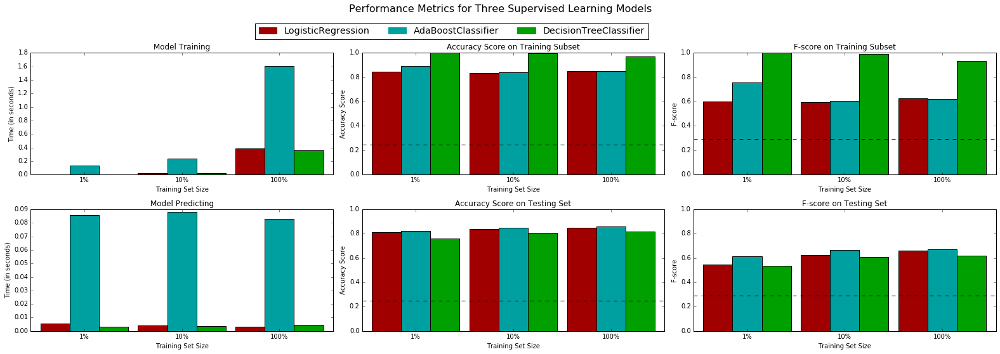

In [11]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

clf_A = LogisticRegression(random_state=1)
clf_B = AdaBoostClassifier(random_state=1)
clf_C = DecisionTreeClassifier(random_state=1)

clf_list = [clf_A, clf_B, clf_C]

samples_1 = int(X_train.shape[0]*0.01)
samples_10 = int(X_train.shape[0]*0.1)
samples_100 = X_train.shape[0]

# Collect results on the learners
results = {}
for clf in clf_list:
    clf_name = clf.__class__.__name__
    results[clf_name] = {}
    for i, samples in enumerate([samples_1, samples_10, samples_100]):
        results[clf_name][i] = \
        train_predict(clf, samples, X_train, y_train, X_test, y_test)

# Run metrics visualization for the three supervised learning models chosen
vs.evaluate(results, accuracy, fscore)

----
## Improving Results
In this final section, you will choose from the three supervised learning models the *best* model to use on the student data. You will then perform a grid search optimization for the model over the entire training set (`X_train` and `y_train`) by tuning at least one parameter to improve upon the untuned model's F-score. 

### Question 3 - Choosing the Best Model
*Based on the evaluation you performed earlier, in one to two paragraphs, explain to *CharityML* which of the three models you believe to be most appropriate for the task of identifying individuals that make more than \$50,000.*  
**Hint:** Your answer should include discussion of the metrics, prediction/training time, and the algorithm's suitability for the data.

**Answer: ** I believe the most appropriate of the algorithms we have tried is the Decision Tree Classifier and here is my reasoning: The three algorithms achieve very similar scores: If we let them train on the full training set and compute the F-score, they are all in the 0.60 to 0.65 range. The same is true for the accuracy. There are only two real differences: 
1. The Decision Tree algorithm performs exceptionally well on the training set. When creating the final model we thus have to be careful not to overfit the training data.
2. The AdaBoost algorithm takes ten times longer than the other algorithms to train. In absolute time this might not be much, but as the database grows, it can make a difference.

Point 2 rules out AdaBoost: Why pay ten times for computation cost if the result is only marginally better?
By the same logic, I will choose the Decision Tree over Logistic Regression: Why use a complex model if a simple one will do? Compared to other algorithms Decision Trees are simple constructs, you can even print them out and immediately comprehend every decision it makes and see for which input it performs well or badly. This is a big advantage compared to linear algebra behemoths like [Support Vector Machines](https://xkcd.com/1838/) or [Neural Networks](https://blog.acolyer.org/2017/05/11/understanding-deep-learning-requires-re-thinking-generalization/) which are very hard to interprete for human beings.

I've heard of countless examples of ML companies who specialized in certain complex ML algorithms like SVMs or NNs and sold ML solutions to clients. Many of them didn't even bother comparing their solutions to more simple algorithms. The client was then left with a system that was hard for him to understand and maintain although there might have been an easy answer to all these problems. Bottomline: You have to find really good arguments to choose a complex (computationally or conceptionally) approach over a simple one. In this example I don't think that the performance advantages (if any) of AdaBoost or Logistic Regression outweigh the simplicity of Decision Trees.

### Question 4 - Describing the Model in Layman's Terms
*In one to two paragraphs, explain to *CharityML*, in layman's terms, how the final model chosen is supposed to work. Be sure that you are describing the major qualities of the model, such as how the model is trained and how the model makes a prediction. Avoid using advanced mathematical or technical jargon, such as describing equations or discussing the algorithm implementation.*

**Answer: ** Imagine you're playing a special version of "Who am I?" with your friends. The goal is to find out who you are with as few yes/no-questions as possible and a negative answer will have no negative effect. What kind of questions would you intuitively as? Probably something like "Am I male/female?", "Am I still alive?", "Am I fictional/real?" or "Am I an animal?" because regardless of the answer, these questions will rule out a lot of suspects. Specialized questions like "Is my eye color brown" might give you a lot of information about "you", but if the answer is no, you gained nothing. A decision tree works the same way: We have a set of suspects belonging to one of two classes and the decision tree will ask the best questions until there are either no questions left to ask, we force it to quit or the answer will perfectly devide the groups. The best question is the question which gives us the most information, i.e. the best split of classes, about the two groups (yes/no) we have created with this question.

Let's take this dataset as an example: We have seen in the scatter plots above, that some features are well suited to find people who earn more than 50k a year and others are not. We know that around a forth of the people in the census earn more than 50k. After we ask a yes/no-questions we devide the list of people into two groups and we want to be as far way from the 3-to-1 ratio from the original group as possible. The best outcome would be: Yes -> only rich people, no -> only poor people or vice-versa. Asking the question "Is your work class 'private'" doesn't help at all, because of the people who work in the private sector around three quarters earn less then 50k. We would be back to square one. However asking "Is you education-num greater or equal to 15?" helps a lot, because most people for whom the answer is "yes" earn more than 50k and most people for whom the answer is "no" earn less. Thus, this would be a good candidate for a question to ask very early.

### Implementation: Model Tuning
Fine tune the chosen model. Use grid search (`GridSearchCV`) with at least one important parameter tuned with at least 3 different values. You will need to use the entire training set for this. In the code cell below, you will need to implement the following:
- Import [`sklearn.grid_search.GridSearchCV`](http://scikit-learn.org/0.17/modules/generated/sklearn.grid_search.GridSearchCV.html) and [`sklearn.metrics.make_scorer`](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.make_scorer.html).
- Initialize the classifier you've chosen and store it in `clf`.
 - Set a `random_state` if one is available to the same state you set before.
- Create a dictionary of parameters you wish to tune for the chosen model.
 - Example: `parameters = {'parameter' : [list of values]}`.
 - **Note:** Avoid tuning the `max_features` parameter of your learner if that parameter is available!
- Use `make_scorer` to create an `fbeta_score` scoring object (with $\beta = 0.5$).
- Perform grid search on the classifier `clf` using the `'scorer'`, and store it in `grid_obj`.
- Fit the grid search object to the training data (`X_train`, `y_train`), and store it in `grid_fit`.

**Note:** Depending on the algorithm chosen and the parameter list, the following implementation may take some time to run!

In [32]:
from sklearn.grid_search import GridSearchCV 
from sklearn.metrics import make_scorer, fbeta_score
from sklearn.tree import export_graphviz

clf=DecisionTreeClassifier(random_state=1)
parameters = {'max_depth': [None, 3, 5, 10]}

scorer = make_scorer(fbeta_score, beta=0.5)

grid_obj = GridSearchCV(clf, parameters,scoring=scorer)
grid_fit = grid_obj.fit(X_train, y_train)

# Get the estimator
best_clf = grid_fit.best_estimator_

# Make predictions using the unoptimized and model
predictions = (clf.fit(X_train, y_train)).predict(X_test)
predictions_train = (clf.fit(X_train, y_train)).predict(X_train)
best_predictions = best_clf.predict(X_test)
best_predictions_train = best_clf.predict(X_train)

# Report the before-and-afterscores
print "Unoptimized model\n------"
print "Accuracy score on training data: {:.4f}".format(accuracy_score(y_train, predictions_train))
print "Accuracy score on testing data: {:.4f}".format(accuracy_score(y_test, predictions))
print "F-score on testing data: {:.4f}".format(fbeta_score(y_test, predictions, beta = 0.5))
print "\nOptimized Model\n------"
print "Final accuracy score on the training data: {:.4f}".format(accuracy_score(y_train, best_predictions_train))
print "Final accuracy score on the testing data: {:.4f}".format(accuracy_score(y_test, best_predictions))
print "Final F-score on the testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5))

clf=best_clf
importances = clf.feature_importances_
indices = np.argsort(importances)[::-1]

export_graphviz(clf, out_file="decision_tree.dot", feature_names=list(X_train))

# Print the feature ranking
print("\nFeature ranking:")

f = 0
accumulated_importance = 0.0
while f < X_train.shape[1]:
    print("%d. feature %d (%f) %s" % (f + 1, indices[f], importances[indices[f]], X_train.columns[indices[f]]))
    accumulated_importance += importances[indices[f]]
    f+=1
    if accumulated_importance > 0.99999:
        break
print "\nDisregarded features: "
print list(X_train.columns[indices[f:]])


Unoptimized model
------
Accuracy score on training data: 0.9725
Accuracy score on testing data: 0.8180
F-score on testing data: 0.6268

Optimized Model
------
Final accuracy score on the training data: 0.8666
Final accuracy score on the testing data: 0.8556
Final F-score on the testing data: 0.7199

Feature ranking:
1. feature 30 (0.394057) marital-status_ Married-civ-spouse
2. feature 1 (0.212113) education-num
3. feature 2 (0.193548) capital-gain
4. feature 3 (0.070301) capital-loss
5. feature 0 (0.048149) age
6. feature 4 (0.029557) hours-per-week
7. feature 38 (0.014909) occupation_ Exec-managerial
8. feature 9 (0.007596) workclass_ Self-emp-not-inc
9. feature 44 (0.005238) occupation_ Prof-specialty
10. feature 60 (0.002750) sex_ Female
11. feature 23 (0.002608) education_level_ HS-grad
12. feature 61 (0.002013) sex_ Male
13. feature 46 (0.001187) occupation_ Sales
14. feature 54 (0.001118) relationship_ Wife
15. feature 47 (0.001018) occupation_ Tech-support
16. feature 45 (0.00

### Question 5 - Final Model Evaluation
_What is your optimized model's accuracy and F-score on the testing data? Are these scores better or worse than the unoptimized model? How do the results from your optimized model compare to the naive predictor benchmarks you found earlier in **Question 1**?_  
**Note:** Fill in the table below with your results, and then provide discussion in the **Answer** box.

#### Results:

|     Metric     | Benchmark Predictor | Unoptimized Model | Optimized Model |
| :------------: | :-----------------: | :---------------: | :-------------: | 
| Accuracy Score |        0.2478       |      0.8180       |   0.8556        |
| F-score        |        0.2917       |      0.6268       |   0.7199        |


**Answer: ** The table shows that both the unoptimized and the optimized model perform much better than our naive predictor and the optimized model performs better than the unoptimized model. This was expected, because - as we saw earlier - the Decision Tree tends to overfit the training data. The unoptimized model falls into this trap: The prediction accuracy on the training data is 97.25% - a huge gap to the test accuracy of 81.8%. Fortunately, after cross validation these two values have converged to 86.66% and 85.56% which is exactly what CV is supposed to do. A better accuracy also leads to a better F-score, which increases from 0.62 to 0.72 after optimization.

----
## Feature Importance

An important task when performing supervised learning on a dataset like the census data we study here is determining which features provide the most predictive power. By focusing on the relationship between only a few crucial features and the target label we simplify our understanding of the phenomenon, which is most always a useful thing to do. In the case of this project, that means we wish to identify a small number of features that most strongly predict whether an individual makes at most or more than \$50,000.

Choose a scikit-learn classifier (e.g., adaboost, random forests) that has a `feature_importance_` attribute, which is a function that ranks the importance of features according to the chosen classifier.  In the next python cell fit this classifier to training set and use this attribute to determine the top 5 most important features for the census dataset.

### Question 6 - Feature Relevance Observation
When **Exploring the Data**, it was shown there are thirteen available features for each individual on record in the census data.  
_Of these thirteen records, which five features do you believe to be most important for prediction, and in what order would you rank them and why?_

**Answer:** Very early in the data exploration phase I created scatter plots comparing every feature to every other feature. I wanted to get a visual impression of which features would be important. This yielded some interesting insights:
1. If you look at the fifth scatter plot (education-num v marital-status) you see that if education-num is below 15 and the marital status is not "married", most dots are red: The person earns less than 50k. However, if the person is married, the percentage of people earning more than 50k rises almost in a logistic fashion from 0 to 1 with the education-num. Also, regardless of marital status: If the education-num is 15 or 16, it's a lot more likely that we have a match. Thus, this two features are very strong indicators.
2. The plot comparing capital loss and capital gain is rather interesting: It serves as a very nice sanity check because the markers can only be on the y- or the x-axis. Otherwise, there would be something wrong with the dataset. Apart from that, we can see in bot axis, that there are some areas that are clear indicators of people who earn a lot. For example, a capital gain between 10,000 and 20,000 very likely belongs to a positive example. There also seem to be areas in the capital loss plot that are easily separable, but not as easy as in the capital gain plot.
3. It's common sense that age also plays a big role here. If we look at the plot comparing age and marital status, we can see that not all married people are big earners: Who have to be of a certain age (~30 to ~60) to be in the money.
4. The plot age v hours-per-week underlines this: You can be of the perfect age, but if you only work 10hrs a week, it's not worth anything. The same applies the other way around: You can work 60hrs a week, but if you're just 20 years old... tough luck. However, if you are 40 and work 40 hours a week it's a lot more likely that you earn lots of money.

Thus, these five are the most important ones: Married-civ-spouse,  education num, capital gain, age and hours per week in descending order, Married-civ-spouse being the most important feature.

One could raise an objection against Married-civ-spouse: It's just one possibilty for the marital status. What if no many people are married in the census data? What about other features that are very clear indicators? Why reject them? 
Here is my reasoning: About have of the people in the census data are married. Thus, I find it valid to use it as my primary criterion. There are other features in the workclass and the occupation category that have a clear connection to someone earing >50k a year. However, only 6000 or less people fall into these categories. So, yes, they will be of some importance, but not as important as the features listed.


### Implementation - Extracting Feature Importance
Choose a `scikit-learn` supervised learning algorithm that has a `feature_importance_` attribute availble for it. This attribute is a function that ranks the importance of each feature when making predictions based on the chosen algorithm.

In the code cell below, you will need to implement the following:
 - Import a supervised learning model from sklearn if it is different from the three used earlier.
 - Train the supervised model on the entire training set.
 - Extract the feature importances using `'.feature_importances_'`.

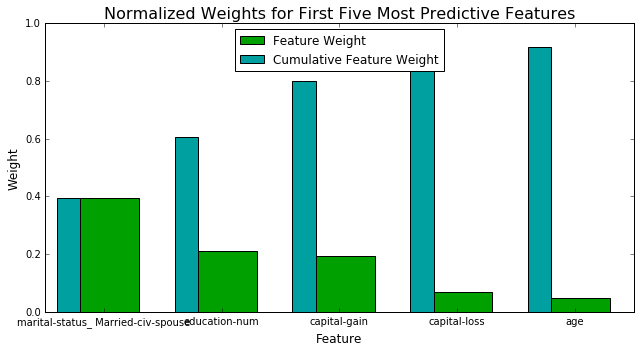

In [72]:
importances = clf.feature_importances_
vs.feature_plot(importances, X_train, y_train)

### Question 7 - Extracting Feature Importance

Observe the visualization created above which displays the five most relevant features for predicting if an individual makes at most or above \$50,000.  
_How do these five features compare to the five features you discussed in **Question 6**? If you were close to the same answer, how does this visualization confirm your thoughts? If you were not close, why do you think these features are more relevant?_

**Answer:** As we can see, the first five features add up to about 90 percent of the feature weight, which is quite impressive, but it makes sense. If we look at the other features in the scatter plots, we can see, that almost no feature explains what these features don't explain:
1. Yes, if you're from india, it's much more likely that you earn >50k than if you come from Mexico. But this is easily explained by the education-num. No need to factor in the country of origin.
2. Yes, if you are a husband or a wife, you earn more. That's what Married-civ-spouse says.
3. Yes, is you have a doctorate, you earn a lot. Look at you education-num.

The feature weights confirm, what the scatter plots indicated and what's easy to deduce from the feature set: It's highly correlated. Some features are even directly dependend on others: If you are a husband or a wife, Married-civ-spouse must be true. If there are no significant differences in the salary of wives and husbands, why include this information? If we look at education_level v education-num we can see that education-num has all the information education_level has. But education_level gets inflated to around a dozen features. Education-num is a lot more concise.
So, yes, the plot confirms my asumption that most of the information is contained in a small feature set. However, I did not expect capital-loss to get the forth rank. The decision tree must be better than me at finding boundaries ;-) Also, hours per week comes in the sixth place, so my gues wasn't that far of.

### Feature Selection
How does a model perform if we only use a subset of all the available features in the data? With less features required to train, the expectation is that training and prediction time is much lower — at the cost of performance metrics. From the visualization above, we see that the top five most important features contribute more than half of the importance of **all** features present in the data. This hints that we can attempt to *reduce the feature space* and simplify the information required for the model to learn. The code cell below will use the same optimized model you found earlier, and train it on the same training set *with only the top five important features*. 

In [34]:
# Import functionality for cloning a model
from sklearn.base import clone

# Reduce the feature space
X_train_reduced = X_train[X_train.columns.values[(np.argsort(importances)[::-1])[:5]]]
X_test_reduced = X_test[X_test.columns.values[(np.argsort(importances)[::-1])[:5]]]

# Train on the "best" model found from grid search earlier
clf = (clone(best_clf)).fit(X_train_reduced, y_train)

export_graphviz(clf, out_file="decision_tree_5_features.dot", feature_names=list(X_train_reduced))

# Make new predictions
reduced_predictions = clf.predict(X_test_reduced)

# Report scores from the final model using both versions of data
print "Final Model trained on full data\n------"
print "Accuracy on testing data: {:.4f}".format(accuracy_score(y_test, best_predictions))
print "F-score on testing data: {:.4f}".format(fbeta_score(y_test, best_predictions, beta = 0.5))
print "\nFinal Model trained on reduced data\n------"
print "Accuracy on testing data: {:.4f}".format(accuracy_score(y_test, reduced_predictions))
print "F-score on testing data: {:.4f}".format(fbeta_score(y_test, reduced_predictions, beta = 0.5))

importances = clf.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("\nFeature ranking:")

f = 0
accumulated_importance = 0.0
while f < X_train.shape[1]:
    print("%d. feature %d (%f) %s" % (f + 1, indices[f], importances[indices[f]], X_train.columns[indices[f]]))
    accumulated_importance += importances[indices[f]]
    f+=1
    if accumulated_importance > 0.99999:
        break
print "\nDisregarded features: "
print list(X_train.columns[indices[f:]])


Final Model trained on full data
------
Accuracy on testing data: 0.8556
F-score on testing data: 0.7199

Final Model trained on reduced data
------
Accuracy on testing data: 0.8532
F-score on testing data: 0.7226

Feature ranking:
1. feature 0 (0.414539) age
2. feature 1 (0.230042) education-num
3. feature 2 (0.216480) capital-gain
4. feature 3 (0.080580) capital-loss
5. feature 4 (0.058358) hours-per-week

Disregarded features: 
[]


### Question 8 - Effects of Feature Selection
*How does the final model's F-score and accuracy score on the reduced data using only five features compare to those same scores when all features are used?*  
*If training time was a factor, would you consider using the reduced data as your training set?*

**Answer:** Reducing the feature set to only five features does not have a big impact on the performance: Accuracy decreases marginally and F-score increases marginally. This can be explained if we look at the resulting decision tree: [Reduced Decision Tree](decision_tree_5_features.png)
By discarding all except five features it seems as if we lose information, but "importance" doesn't necessarily mean "information". Before, for every way down the decision tree every category was the subject of a question once, maybe twice. Now, we have only five features, but ten questions to ask. Thus, we can ask questions about certain features more than once. This is useful for example if we look at capital gain and capital loss: There is no clear threshold which would allow us to say "People with a capital gain/loss above/below this threshold earn less/more than 50k a year", but there are ranges where this is true. Focussing on the five most prominent features allows us to find these ranges and apparently they contain as much information as the features we omitted.


> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  
**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.